In [ ]:
import os
import pandas as pd
import numpy as np
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input
from sklearn.model_selection import train_test_split
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout
from keras.utils import to_categorical
from keras.optimizers import Adam
from keras.models import Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_file_path = '/content/drive/MyDrive/Datasets/kidney_refined_img'
csv_file_path = '/content/drive/MyDrive/Datasets/Coldsheet.csv'

In [ ]:
scores_df = pd.read_csv(csv_file_path)
scores_df.head()

,Name of image,Score of 1 - 5
0,Cold Kidney 2,5
1,Cold Kidney 3,5
2,Cold Kidney 4,5
3,Cold Kidney 5,5
4,Cold Kidney 6,4


In [ ]:
def load_and_preprocess_image(image_path):
    try:
        if os.path.isfile(image_path):
            img = load_img(image_path, target_size=(224, 224))
            img_array = img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0)
            img_array = preprocess_input(img_array)
            return img_array
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
    return None

In [ ]:
image_dir = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new'
image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, filename))]
image_arrays = [load_and_preprocess_image(path) for path in image_paths if load_and_preprocess_image(path) is not None]
image_arrays = np.vstack([img_array for img_array in image_arrays if img_array is not None])

def format_filename(name):
    return os.path.splitext(name)[0].lower().strip()

scores_df['formatted_name'] = scores_df['Name of image'].apply(format_filename)
name_to_score = dict(zip(scores_df['formatted_name'], scores_df['Score of 1 - 5']))

In [ ]:
scores = []
not_found = []

for path in image_paths:
    if os.path.isfile(path):
        base_name = format_filename(os.path.basename(path))
        score = name_to_score.get(base_name, None)
        if score is not None:
            scores.append(score)
        else:
            not_found.append(os.path.basename(path))
            scores.append(-1)

if not_found:
    print("No scores found for the following files:")
    for file in not_found:
        print(file)
else:
    print("All files matched successfully.")

All files matched successfully.


In [ ]:
scores = np.array(scores)
valid_indices = [i for i, score in enumerate(scores) if score != -1]
image_arrays = image_arrays[valid_indices]
scores = np.array([scores[i] for i in valid_indices])

In [ ]:
# Subtract 1 from each score to shift from 1-5 to 0-4
scores = scores - 1

#**VGG16**

In [ ]:
# Load the VGG16 model, pre-trained weights, exclude the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
model = Sequential([
    base_model,
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax')  # assuming score 1-5, hence 5 classes
])

In [ ]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
train_images, val_images, train_scores, val_scores = train_test_split(image_arrays, scores, test_size=0.2, random_state=42)

In [ ]:
model.fit(train_images, train_scores, epochs=10, validation_data=(val_images, val_scores))

Epoch 1/10
3/3 [==============================] - 111s 38s/step - loss: 15.4727 - accuracy: 0.2625 - val_loss: 9.8464 - val_accuracy: 0.3000
Epoch 2/10
3/3 [==============================] - 78s 28s/step - loss: 2.5248 - accuracy: 0.7375 - val_loss: 14.7488 - val_accuracy: 0.4000
Epoch 3/10
3/3 [==============================] - 71s 25s/step - loss: 0.5007 - accuracy: 0.9000 - val_loss: 17.8933 - val_accuracy: 0.3500
Epoch 4/10
3/3 [==============================] - 72s 25s/step - loss: 0.1929 - accuracy: 0.9625 - val_loss: 20.2195 - val_accuracy: 0.4000
Epoch 5/10
3/3 [==============================] - 63s 22s/step - loss: 0.1448 - accuracy: 0.9750 - val_loss: 21.2147 - val_accuracy: 0.4500
Epoch 6/10
3/3 [==============================] - 70s 25s/step - loss: 0.2335 - accuracy: 0.9875 - val_loss: 20.6884 - val_accuracy: 0.5000
Epoch 7/10
3/3 [==============================] - 62s 21s/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 20.3518 - val_accuracy: 0.5000
Epoch 8/10
3/3 [===

In [ ]:
val_loss, val_acc = model.evaluate(val_images, val_scores)
print(f"Validation accuracy: {val_acc*100:.2f}%")

1/1 [==============================] - 12s 12s/step - loss: 19.8599 - accuracy: 0.5000
Validation accuracy: 50.00%


In [ ]:
# model_path = "/content/drive/MyDrive/Others Work/vgg16"
# model.save(model_path)

In [ ]:
# np.save('/content/drive/MyDrive/Others Work/vgg16/X_train.npy', train_images)
# np.save('/content/drive/MyDrive/Others Work/vgg16/X_test.npy', val_images)
# np.save('/content/drive/MyDrive/Others Work/vgg16/y_train_one_hot.npy', train_scores)
# np.save('/content/drive/MyDrive/Others Work/vgg16/y_test_one_hot.npy', val_scores)

In [ ]:
for i, layer in enumerate(model.layers):
    print(i, layer.name)

0 vgg16
1 flatten
2 dense
3 dropout
4 dense_1


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
# Load the base VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False)

# Define the layers from which you want to extract features
layer_names = ['block1_pool', 'block2_pool', 'block3_pool', 'block4_pool', 'block5_pool']
layer_outputs = [base_model.get_layer(name).output for name in layer_names]
multi_output_model = Model(inputs=base_model.input, outputs=layer_outputs)

def extract_features(image_tensor):
    # Ensure the image tensor is in the right format
    image_tensor = preprocess_input(image_tensor)
    # Expand the dimensions of the image tensor to include batch size
    image_tensor = np.expand_dims(image_tensor, axis=0)
    try:
        return multi_output_model.predict(image_tensor)
    except Exception as e:
        print(f"Error during model prediction: {e}")
        return None

features_by_layer = [[] for _ in range(len(layer_names))]

for image_array in image_arrays:
    if image_array.ndim == 3:
        image_array = np.expand_dims(image_array, axis=0)

    if image_array.ndim != 4:
        print(f"Skipping an image due to unexpected dimensions: {image_array.shape}")
        continue

    # Extract features for all layers
    features_per_layer = extract_features(image_array[0])
    if features_per_layer is None:
        continue

    # Flatten and collect features separately for each layer
    for i, features in enumerate(features_per_layer):
        layer_name = layer_names[i]
        feature_shape = features.shape
        print(f"Layer {layer_name}: Feature shape {feature_shape}")

        flattened_features = features.reshape(-1)  # Flatten the features
        features_by_layer[i].append(flattened_features)

# Save the features to disk
for i, layer_features in enumerate(features_by_layer):
    features_array = np.vstack(layer_features)
    save_path = f'/content/drive/MyDrive/Others Work/vgg16/kidney_features_layer_{i}.npy'
    np.save(save_path, features_array)
    print(f"Features for layer {layer_names[i]} saved to {save_path}")


1/1 [==============================] - 1s 896ms/step
Layer block1_pool: Feature shape (1, 112, 112, 64)
Layer block2_pool: Feature shape (1, 56, 56, 128)
Layer block3_pool: Feature shape (1, 28, 28, 256)
Layer block4_pool: Feature shape (1, 14, 14, 512)
Layer block5_pool: Feature shape (1, 7, 7, 512)
1/1 [==============================] - 1s 576ms/step
Layer block1_pool: Feature shape (1, 112, 112, 64)
Layer block2_pool: Feature shape (1, 56, 56, 128)
Layer block3_pool: Feature shape (1, 28, 28, 256)
Layer block4_pool: Feature shape (1, 14, 14, 512)
Layer block5_pool: Feature shape (1, 7, 7, 512)
1/1 [==============================] - 1s 565ms/step
Layer block1_pool: Feature shape (1, 112, 112, 64)
Layer block2_pool: Feature shape (1, 56, 56, 128)
Layer block3_pool: Feature shape (1, 28, 28, 256)
Layer block4_pool: Feature shape (1, 14, 14, 512)
Layer block5_pool: Feature shape (1, 7, 7, 512)
1/1 [==============================] - 1s 613ms/step
Layer block1_pool: Feature shape (1, 112,

In [ ]:
features_array.shape

(100, 25088)

In [ ]:
features = features_by_layer[-1]

# Assuming 'image_paths' contains the paths for each image corresponding to each feature row in 'features'
# 'name_to_score' is a dictionary mapping filenames to scores

# Match scores with features
matched_scores = []
feature_list = []
not_found = []

for i, path in enumerate(image_paths):
    if os.path.isfile(path):
        base_name = format_filename(os.path.basename(path))
        score = name_to_score.get(base_name, None)
        if score is not None:
            matched_scores.append(score)
            feature_list.append(features[i])
        else:
            not_found.append(os.path.basename(path))

if not_found:
    print("No scores found for the following files:")
    for file in not_found:
        print(file)
else:
    print("All files matched successfully.")

# Convert lists to numpy arrays for machine learning processing
matched_scores = np.array(matched_scores)
feature_array = np.vstack(feature_list)

All files matched successfully.


In [ ]:
X_train = np.load('/content/drive/MyDrive/Others Work/vgg16/X_train.npy')
X_test = np.load('/content/drive/MyDrive/Others Work/vgg16/X_test.npy')
y_train_one_hot = np.load('/content/drive/MyDrive/Others Work/vgg16/y_train_one_hot.npy')
y_test_one_hot = np.load('/content/drive/MyDrive/Others Work/vgg16/y_test_one_hot.npy')

In [ ]:
predictions = model.predict(X_test)
predicted_scores = np.argmax(predictions, axis=1) + 1

1/1 [==============================] - 13s 13s/step


In [ ]:
predicted_scores

array([1, 1, 1, 3, 1, 4, 3, 1, 4, 3, 3, 1, 1, 1, 3, 2, 1, 1, 3, 1])

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
X_train, X_test, y_train, y_test = train_test_split(feature_array, matched_scores, test_size=0.2, random_state=42)

# Initialize and train the classifier
classifier = LogisticRegression(max_iter=1000)  # Increasing max_iter for convergence if necessary
classifier.fit(X_train, y_train)

# Predict and evaluate the classifier
predictions = classifier.predict(X_test)
accuracy = accuracy_score(y_test, predictions)

print(f"Test Accuracy: {accuracy:.2f}")

Test Accuracy: 0.45


#**LogisticRegression**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
def train_and_evaluate(features, scores, layer_name):
    X_train, X_test, y_train, y_test = train_test_split(features, scores, test_size=0.2, random_state=42)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    classifier = LogisticRegression(max_iter=1000, class_weight='balanced')
    classifier.fit(X_train_scaled, y_train)

    predictions = classifier.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, predictions)

    print(f"Accuracy for {layer_name}: {accuracy:.2f}")
    print(classification_report(y_test, predictions))

In [ ]:
# 'scores' contains the matched target scores for each image
for i, layer_features in enumerate(features_by_layer):
    layer_name = layer_names[i]  # 'layer_names' list exists
    layer_features_array = np.vstack(layer_features)
    train_and_evaluate(layer_features_array, scores, layer_name)

Accuracy for block1_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7

    accuracy                           0.35        20
   macro avg       0.25      0.25      0.24        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block2_pool: 0.35
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.50      0.14      0.22         7

    accuracy                           0.35        20
   macro avg       0.26      0.25      0.22        20
weighted avg       0.37      0.35      0.31        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block3_pool: 0.45
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       1.00      0.43      0.60         7

    accuracy                           0.45        20
   macro avg       0.39      0.32      0.32        20
weighted avg       0.54      0.45      0.44        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block4_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         0

    accuracy                           0.35        20
   macro avg       0.20      0.20      0.19        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Accuracy for block5_pool: 0.40
              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.00      0.00      0.00         4
           2       0.10      0.50      0.17         2
           3       0.67      0.29      0.40         7

    accuracy                           0.40        20
   macro avg       0.37      0.38      0.32        20
weighted avg       0.49      0.40      0.41        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#**SVM**

In [ ]:
from sklearn.svm import SVC

def train_and_evaluate_svm(features, scores, layer_name):
    X_train, X_test, y_train, y_test = train_test_split(features, scores, test_size=0.2, random_state=42)

    # Standardizing the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    classifier = SVC(kernel='linear', C=1)
    classifier.fit(X_train_scaled, y_train)

    predictions = classifier.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, predictions)

    print(f"Accuracy for {layer_name}: {accuracy:.2f}")
    print(classification_report(y_test, predictions))

In [ ]:
# 'scores' contains the matched target scores for each image
for i, layer_features in enumerate(features_by_layer):
    layer_name = layer_names[i]  # 'layer_names' list exists
    layer_features_array = np.vstack(layer_features)
    train_and_evaluate(layer_features_array, scores, layer_name)

Accuracy for block1_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7

    accuracy                           0.35        20
   macro avg       0.25      0.25      0.24        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block2_pool: 0.35
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.50      0.14      0.22         7

    accuracy                           0.35        20
   macro avg       0.26      0.25      0.22        20
weighted avg       0.37      0.35      0.31        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block3_pool: 0.45
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       1.00      0.43      0.60         7

    accuracy                           0.45        20
   macro avg       0.39      0.32      0.32        20
weighted avg       0.54      0.45      0.44        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block4_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         0

    accuracy                           0.35        20
   macro avg       0.20      0.20      0.19        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Accuracy for block5_pool: 0.40
              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.00      0.00      0.00         4
           2       0.10      0.50      0.17         2
           3       0.67      0.29      0.40         7

    accuracy                           0.40        20
   macro avg       0.37      0.38      0.32        20
weighted avg       0.49      0.40      0.41        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#**RandomForestClassifier**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

def train_and_evaluate_rf(features, scores, layer_name):
    X_train, X_test, y_train, y_test = train_test_split(features, scores, test_size=0.2, random_state=42)

    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    classifier.fit(X_train, y_train)

    predictions = classifier.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)

    print(f"Accuracy for {layer_name}: {accuracy:.2f}")
    print(classification_report(y_test, predictions))

In [ ]:
# 'scores' contains the matched target scores for each image
for i, layer_features in enumerate(features_by_layer):
    layer_name = layer_names[i]  # 'layer_names' list exists
    layer_features_array = np.vstack(layer_features)
    train_and_evaluate(layer_features_array, scores, layer_name)

Accuracy for block1_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7

    accuracy                           0.35        20
   macro avg       0.25      0.25      0.24        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block2_pool: 0.35
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.50      0.14      0.22         7

    accuracy                           0.35        20
   macro avg       0.26      0.25      0.22        20
weighted avg       0.37      0.35      0.31        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block3_pool: 0.45
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       1.00      0.43      0.60         7

    accuracy                           0.45        20
   macro avg       0.39      0.32      0.32        20
weighted avg       0.54      0.45      0.44        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block4_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         0

    accuracy                           0.35        20
   macro avg       0.20      0.20      0.19        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Accuracy for block5_pool: 0.40
              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.00      0.00      0.00         4
           2       0.10      0.50      0.17         2
           3       0.67      0.29      0.40         7

    accuracy                           0.40        20
   macro avg       0.37      0.38      0.32        20
weighted avg       0.49      0.40      0.41        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#**GradientBoostingClassifier**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

def train_and_evaluate_gbm(features, scores, layer_name):
    X_train, X_test, y_train, y_test = train_test_split(features, scores, test_size=0.2, random_state=42)

    classifier = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
    classifier.fit(X_train, y_train)

    predictions = classifier.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)

    print(f"Accuracy for {layer_name}: {accuracy:.2f}")
    print(classification_report(y_test, predictions))

In [ ]:
# 'scores' contains the matched target scores for each image
for i, layer_features in enumerate(features_by_layer):
    layer_name = layer_names[i]  # 'layer_names' list exists
    layer_features_array = np.vstack(layer_features)
    train_and_evaluate(layer_features_array, scores, layer_name)

Accuracy for block1_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7

    accuracy                           0.35        20
   macro avg       0.25      0.25      0.24        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block2_pool: 0.35
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.50      0.14      0.22         7

    accuracy                           0.35        20
   macro avg       0.26      0.25      0.22        20
weighted avg       0.37      0.35      0.31        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block3_pool: 0.45
              precision    recall  f1-score   support

           0       0.55      0.86      0.67         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       1.00      0.43      0.60         7

    accuracy                           0.45        20
   macro avg       0.39      0.32      0.32        20
weighted avg       0.54      0.45      0.44        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy for block4_pool: 0.35
              precision    recall  f1-score   support

           0       0.67      0.86      0.75         7
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         2
           3       0.33      0.14      0.20         7
           4       0.00      0.00      0.00         0

    accuracy                           0.35        20
   macro avg       0.20      0.20      0.19        20
weighted avg       0.35      0.35      0.33        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

Accuracy for block5_pool: 0.40
              precision    recall  f1-score   support

           0       0.71      0.71      0.71         7
           1       0.00      0.00      0.00         4
           2       0.10      0.50      0.17         2
           3       0.67      0.29      0.40         7

    accuracy                           0.40        20
   macro avg       0.37      0.38      0.32        20
weighted avg       0.49      0.40      0.41        20



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#**Layers Output**

block1

1/1 [==============================] - 0s 146ms/step


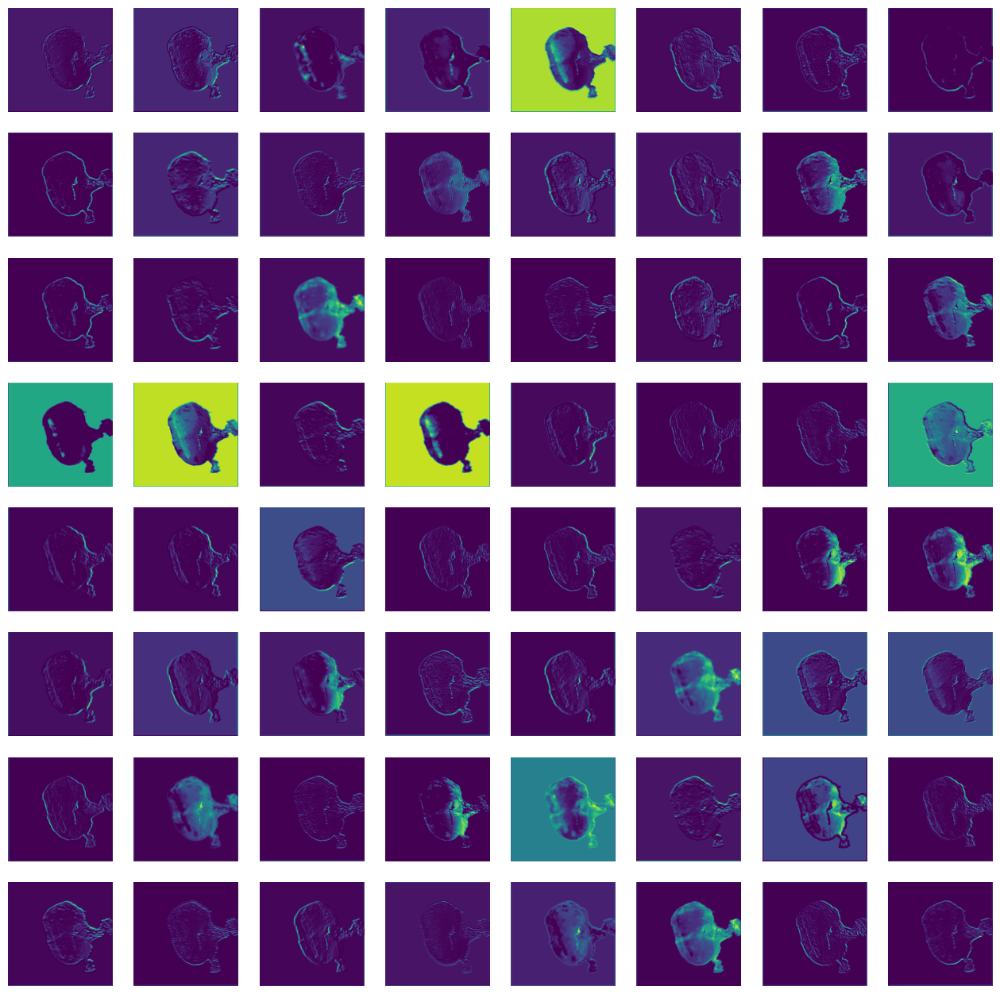

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block1_conv2'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 219ms/step


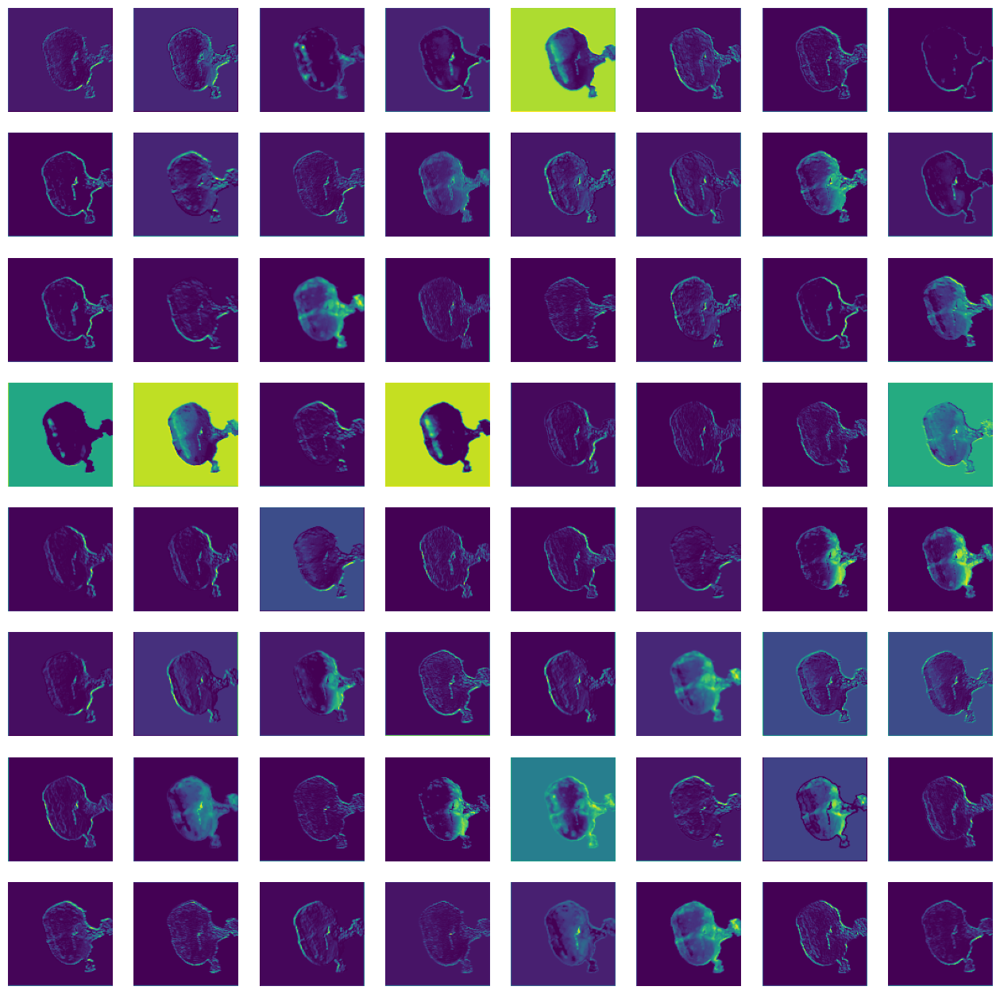

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block1_pool'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

block2

1/1 [==============================] - 0s 249ms/step


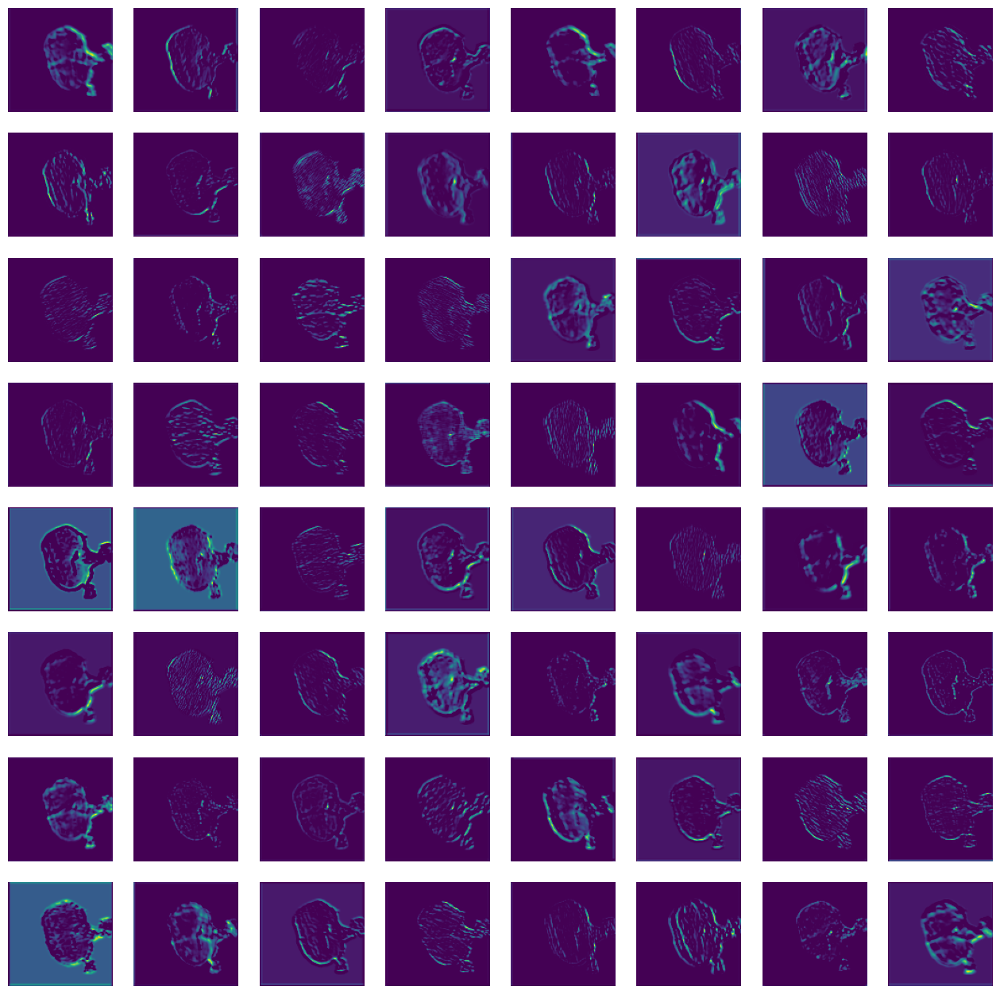

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block2_conv2'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 250ms/step


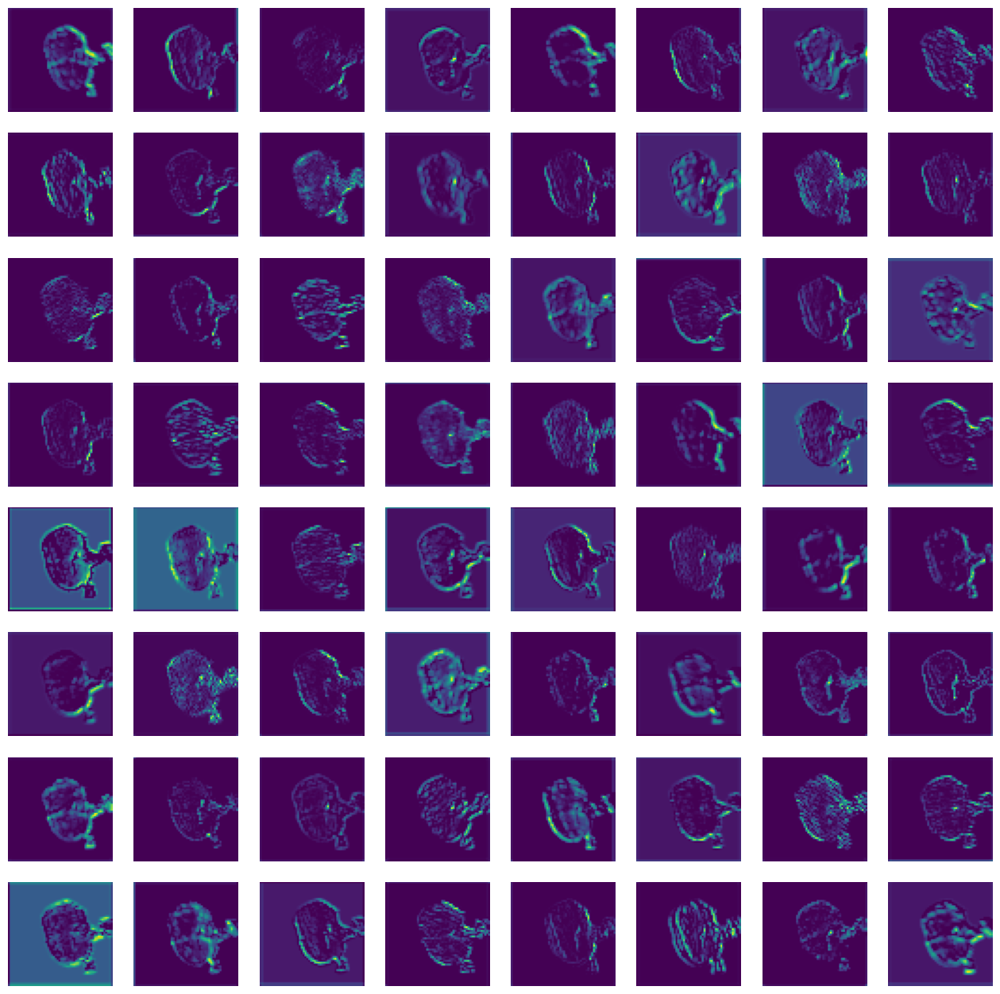

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block2_pool'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

block3

1/1 [==============================] - 1s 633ms/step


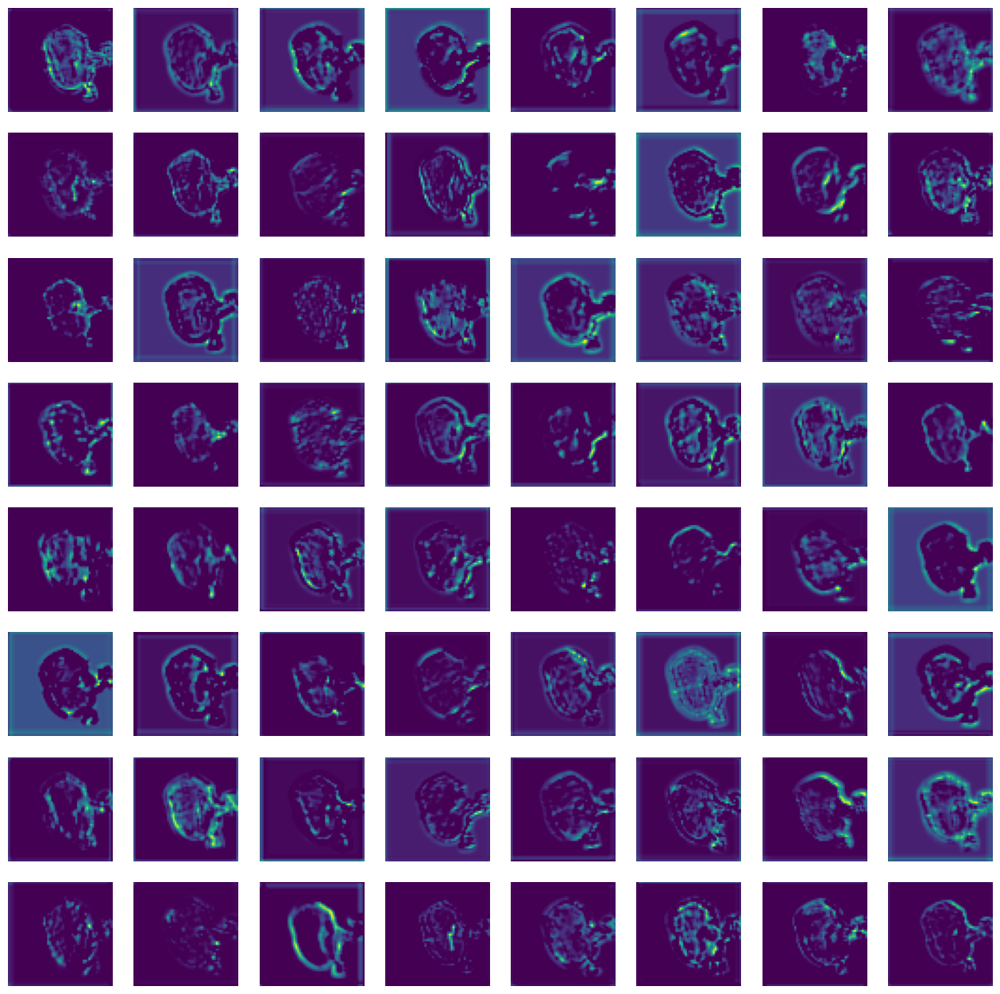

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block3_conv2'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 433ms/step


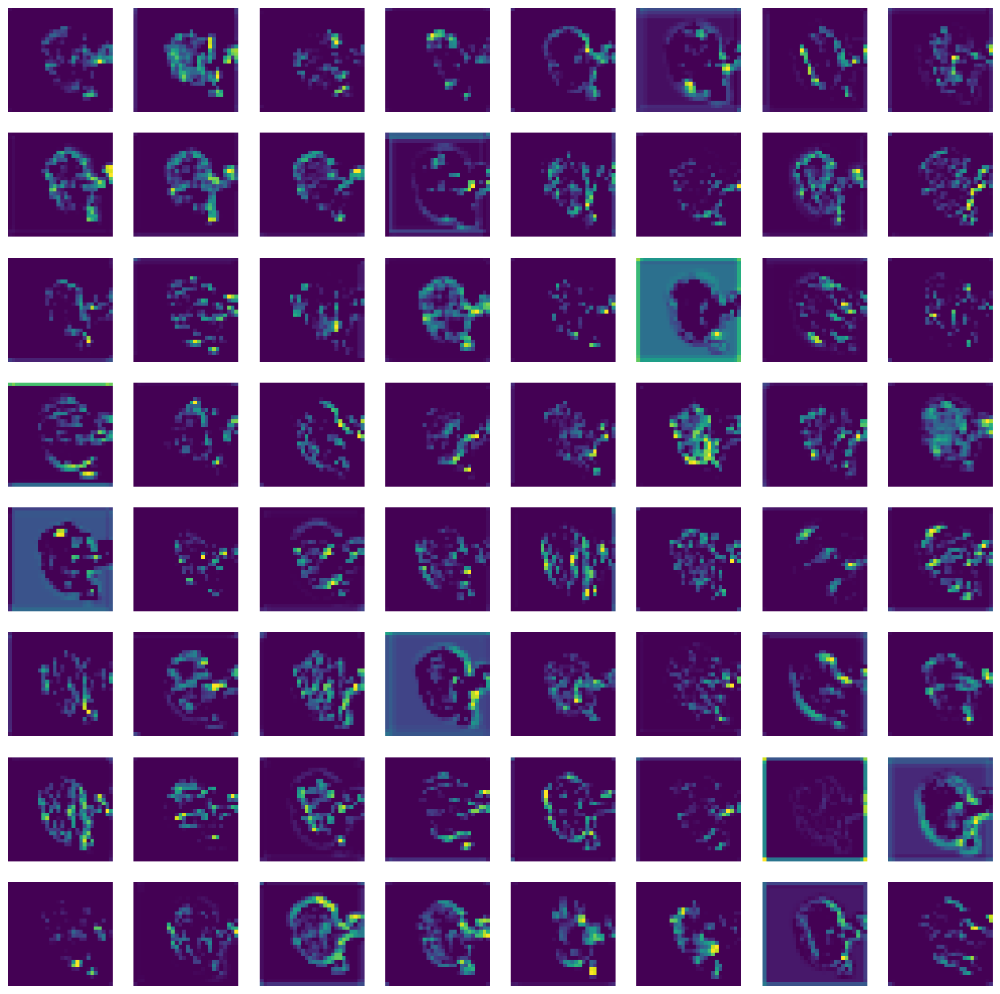

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block3_pool'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

block4

1/1 [==============================] - 1s 537ms/step


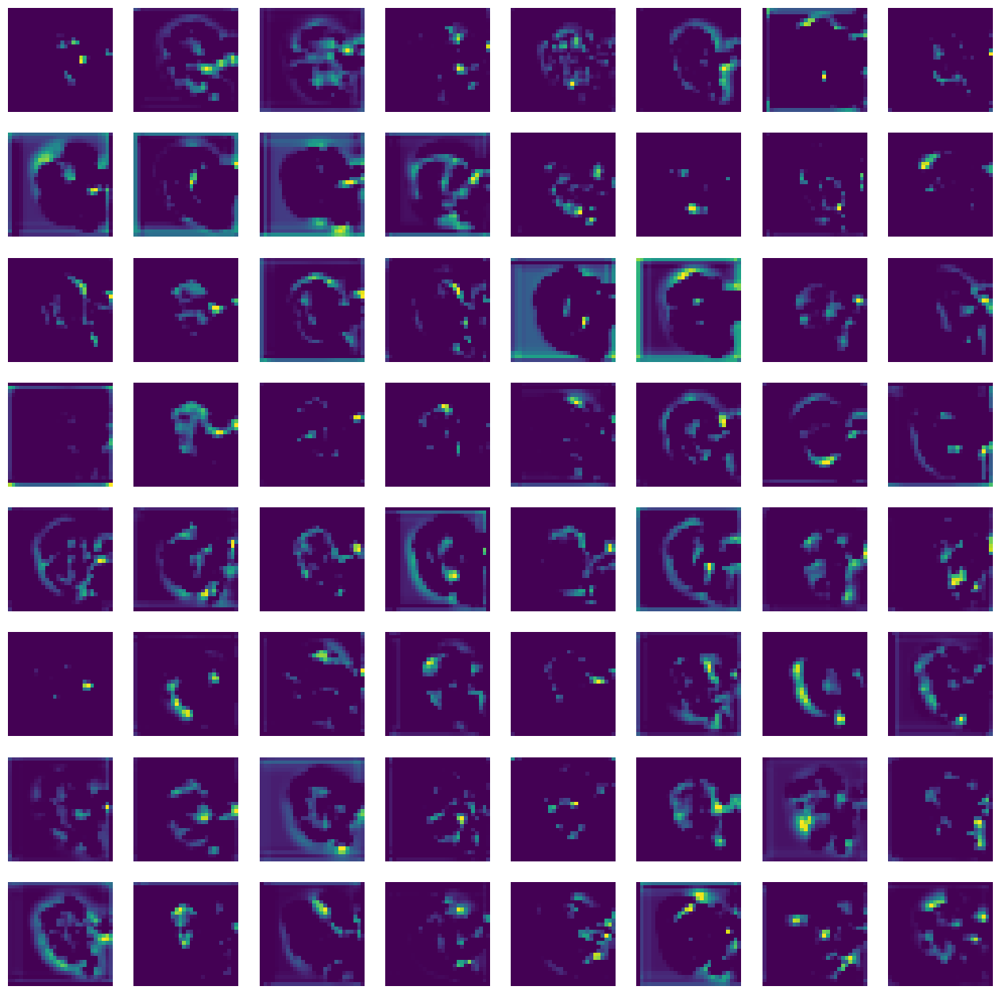

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block4_conv2'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

1/1 [==============================] - 1s 645ms/step


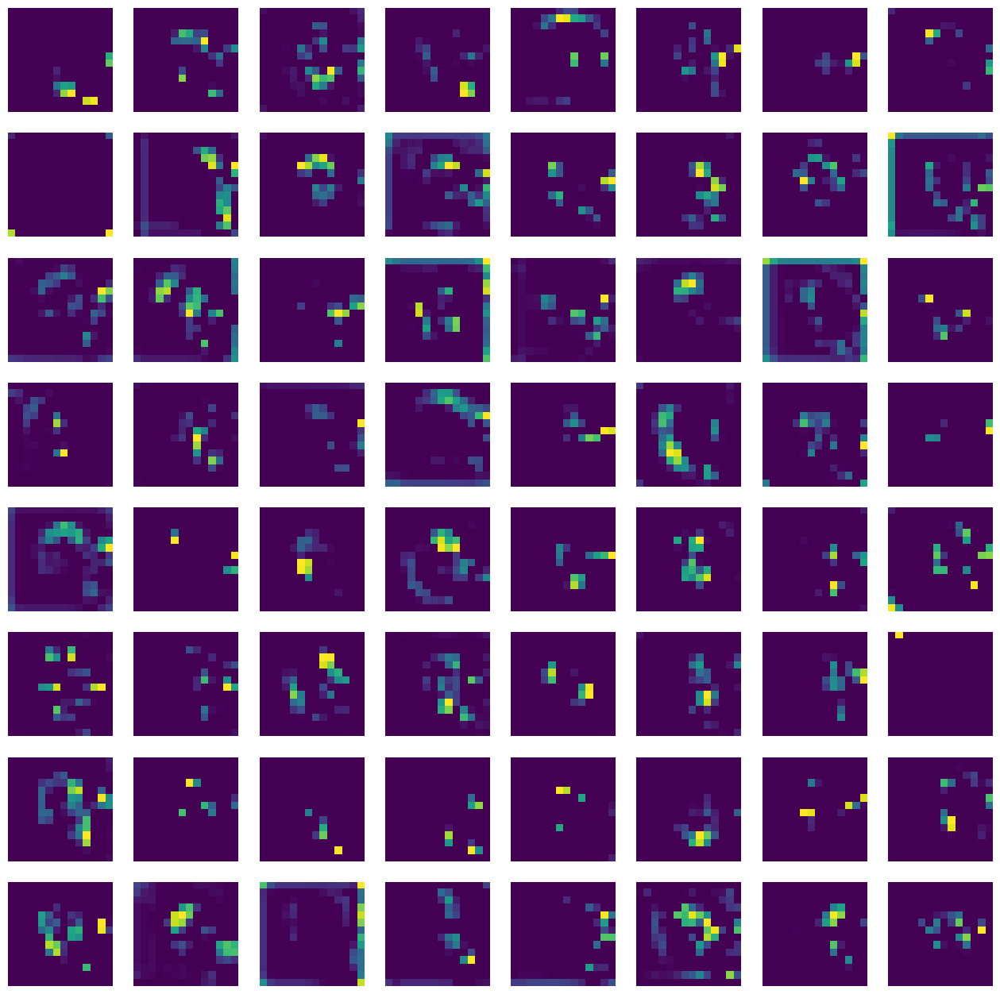

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block4_pool'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

block5

1/1 [==============================] - 1s 1s/step


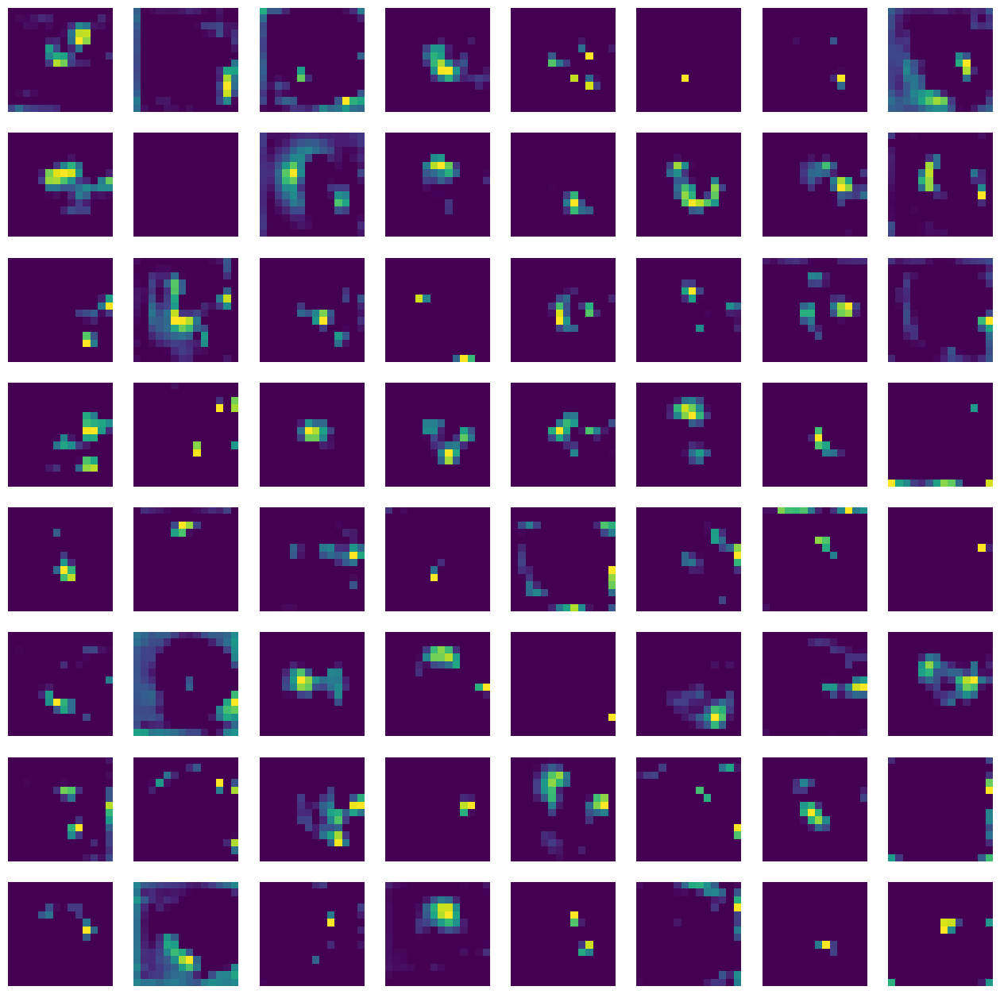

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block5_conv2'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

1/1 [==============================] - 1s 711ms/step


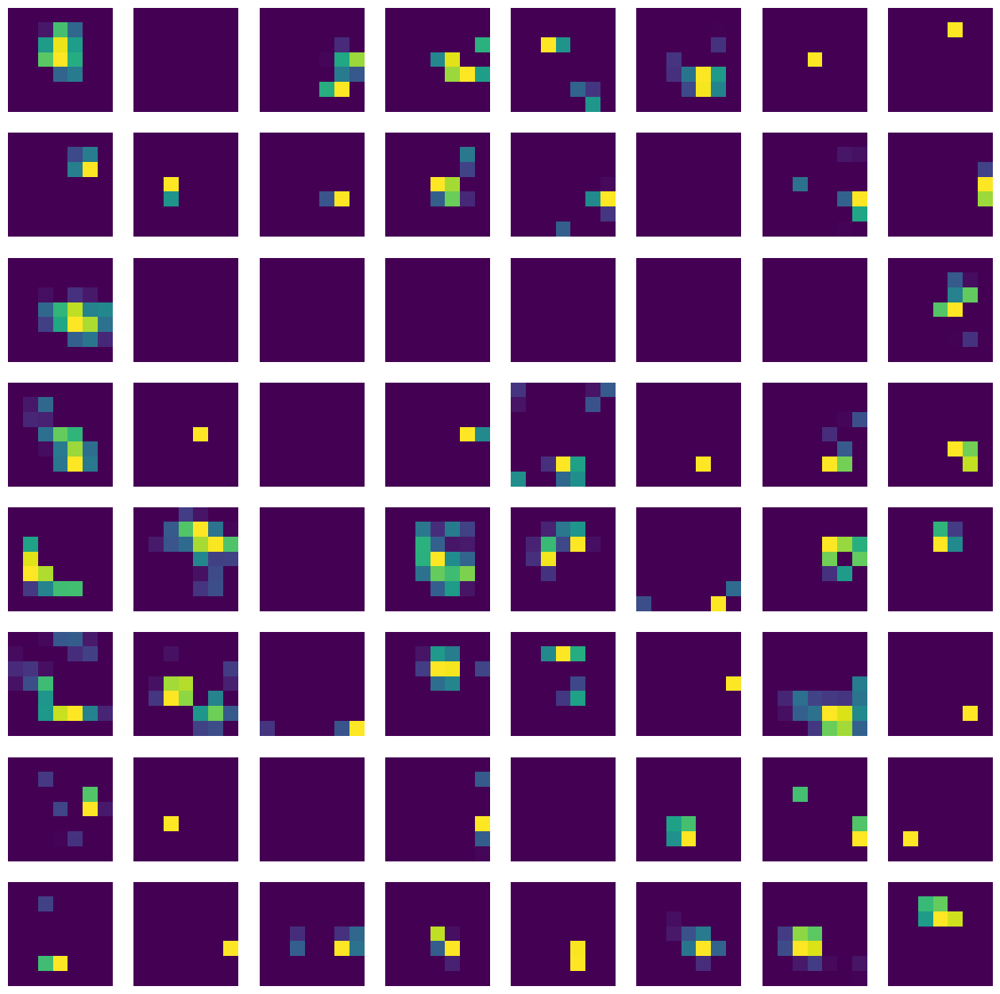

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Load an image
image_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
image = tf.keras.preprocessing.image.img_to_array(image)
image = tf.keras.applications.vgg16.preprocess_input(image)
image = tf.expand_dims(image, axis=0)

# Load the pre-trained VGG16 model
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Define the layer from which you want to visualize activations
layer_name = 'block5_pool'
layer = model.get_layer(layer_name)
activation_model = tf.keras.models.Model(inputs=model.inputs, outputs=layer.output)

# Get activations for the image
activations = activation_model.predict(image)

# Visualize the activations
plt.figure(figsize=(16, 16))
for i in range(64):  # Visualize the activations of the first 64 filters
    plt.subplot(8, 8, i + 1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.show()

#**Extra Work**

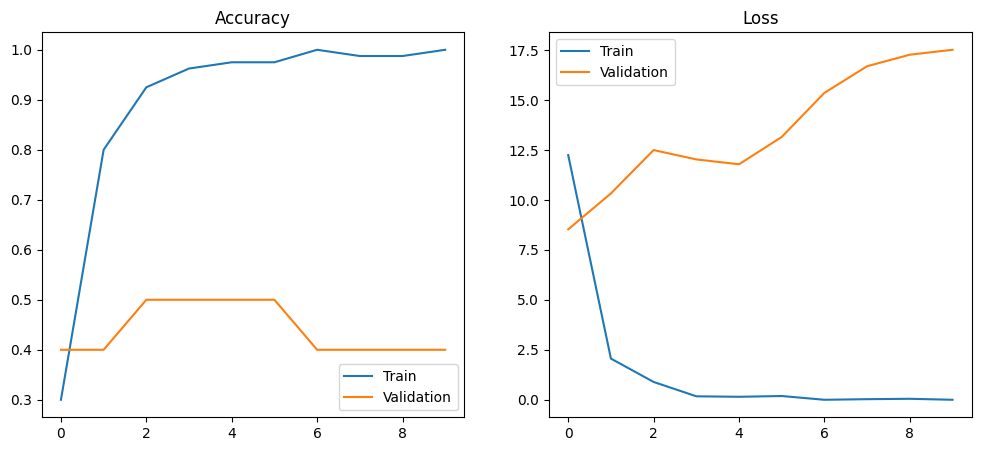

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Loss')
plt.legend()

plt.show()


#**Data Augmentation**

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Create an image data generator with augmentation
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [ ]:
# No augmentation for the validation data
val_datagen = ImageDataGenerator()

In [ ]:
# Apply the generator to the training and validation data
train_generator = train_datagen.flow(train_images, train_scores, batch_size=32)
val_generator = val_datagen.flow(val_images, val_scores, batch_size=32)

In [ ]:
batch_size = 32  # Or any suitable smaller number if your dataset size is small
steps_per_epoch = max(1, len(train_images) // batch_size)

In [ ]:
DA_history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=10,
    validation_data=val_generator,
    validation_steps=max(1, len(val_images) // batch_size)
)

Epoch 1/10
2/2 [==============================] - 46s 28s/step - loss: 6.8611 - accuracy: 0.5781 - val_loss: 10.9849 - val_accuracy: 0.3500
Epoch 2/10
2/2 [==============================] - 48s 38s/step - loss: 5.2163 - accuracy: 0.5417 - val_loss: 10.4477 - val_accuracy: 0.4000
Epoch 3/10
2/2 [==============================] - 57s 38s/step - loss: 3.7839 - accuracy: 0.5781 - val_loss: 11.5097 - val_accuracy: 0.4500
Epoch 4/10
2/2 [==============================] - 47s 27s/step - loss: 4.0775 - accuracy: 0.6406 - val_loss: 11.5448 - val_accuracy: 0.4500
Epoch 5/10
2/2 [==============================] - 56s 37s/step - loss: 6.3790 - accuracy: 0.5156 - val_loss: 10.9829 - val_accuracy: 0.4500
Epoch 6/10
2/2 [==============================] - 47s 28s/step - loss: 3.3142 - accuracy: 0.6875 - val_loss: 10.9204 - val_accuracy: 0.5000
Epoch 7/10
2/2 [==============================] - 37s 28s/step - loss: 3.0650 - accuracy: 0.6458 - val_loss: 10.3045 - val_accuracy: 0.5500
Epoch 8/10
2/2 [====

#**Learning Rate Adjustment**

In [ ]:
from keras.callbacks import ReduceLROnPlateau

# Callback to reduce learning rate when a metric has stopped improving
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.00001)

lr_history = model.fit(train_images, train_scores, epochs=10,
                    validation_data=(val_images, val_scores),
                    callbacks=[reduce_lr])

Epoch 1/10
3/3 [==============================] - 65s 23s/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 11.3147 - val_accuracy: 0.3000 - lr: 1.0000e-04
Epoch 2/10
3/3 [==============================] - 64s 23s/step - loss: 0.0246 - accuracy: 0.9875 - val_loss: 11.8565 - val_accuracy: 0.3000 - lr: 1.0000e-04
Epoch 3/10
3/3 [==============================] - 64s 23s/step - loss: 0.0323 - accuracy: 0.9875 - val_loss: 11.8104 - val_accuracy: 0.3000 - lr: 1.0000e-04
Epoch 4/10
3/3 [==============================] - 54s 18s/step - loss: 0.0214 - accuracy: 0.9875 - val_loss: 11.6614 - val_accuracy: 0.3000 - lr: 2.0000e-05
Epoch 5/10
3/3 [==============================] - 63s 23s/step - loss: 0.1240 - accuracy: 0.9750 - val_loss: 11.4746 - val_accuracy: 0.3000 - lr: 2.0000e-05
Epoch 6/10
3/3 [==============================] - 64s 23s/step - loss: 0.0506 - accuracy: 0.9875 - val_loss: 11.4265 - val_accuracy: 0.3000 - lr: 1.0000e-05
Epoch 7/10
3/3 [==============================] - 64s 23s/

#**Fine Tuning**

In [ ]:
# Unfreeze the last few layers of the base model
for layer in base_model.layers[-4:]:
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

ft_history = model.fit(train_images, train_scores, epochs=10,
                    validation_data=(val_images, val_scores))

Epoch 1/10
3/3 [==============================] - 79s 26s/step - loss: 0.0461 - accuracy: 0.9875 - val_loss: 18.2686 - val_accuracy: 0.2000
Epoch 2/10
3/3 [==============================] - 73s 26s/step - loss: 0.2413 - accuracy: 0.9625 - val_loss: 12.8779 - val_accuracy: 0.4500
Epoch 3/10
3/3 [==============================] - 73s 26s/step - loss: 0.4552 - accuracy: 0.9500 - val_loss: 15.5173 - val_accuracy: 0.4500
Epoch 4/10
3/3 [==============================] - 72s 26s/step - loss: 0.9108 - accuracy: 0.9500 - val_loss: 12.9672 - val_accuracy: 0.5000
Epoch 5/10
3/3 [==============================] - 72s 26s/step - loss: 0.0218 - accuracy: 0.9875 - val_loss: 12.9411 - val_accuracy: 0.5000
Epoch 6/10
3/3 [==============================] - 63s 21s/step - loss: 0.1913 - accuracy: 0.9500 - val_loss: 12.1738 - val_accuracy: 0.5000
Epoch 7/10
3/3 [==============================] - 74s 26s/step - loss: 2.6914e-04 - accuracy: 1.0000 - val_loss: 11.8676 - val_accuracy: 0.5000
Epoch 8/10
3/3 [

**Layers**

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 256)               6422784   
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_9 (Dense)             (None, 5)                 1285      
                                                                 
Total params: 21138757 (80.64 MB)
Trainable params: 6424069 (24.51 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [ ]:
print("Total layers:", len(model.layers))

Total layers: 5


In [ ]:
from keras.models import Model

# Create a list to hold models for each layer's output
layer_outputs = [layer.output for layer in base_model.layers]
layer_models = [Model(inputs=base_model.input, outputs=output) for output in layer_outputs]

# Function to extract features from a specific model
def extract_features(model, input_images):
    return model.predict(input_images)


In [ ]:
# Dictionary to hold features from each layer
features_per_layer = {}

for i, layer_model in enumerate(layer_models):
    features = extract_features(layer_model, train_images)
    features_per_layer[f"Layer_{i}"] = features


3/3 [==============================] - 14s 3s/step


3/3 [==============================] - 12s 4s/step


3/3 [==============================] - 50s 15s/step


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Dictionary to store accuracy for each layer's features
layer_accuracy = {}

for layer_name, features in features_per_layer.items():
    # Flatten features if necessary (for dense layers output)
    if len(features.shape) > 2:
        features = features.reshape(features.shape[0], -1)

    # Split features into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(features, train_scores, test_size=0.2, random_state=42)

    # Train a simple classifier
    classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    classifier.fit(X_train, y_train)

    # Validate the classifier
    predictions = classifier.predict(X_val)
    accuracy = accuracy_score(y_val, predictions)
    layer_accuracy[layer_name] = accuracy

# Print the accuracy for each layer
for layer, acc in layer_accuracy.items():
    print(f"Accuracy for {layer}: {acc:.2f}")


Accuracy for Layer_0: 0.38
Accuracy for Layer_1: 0.50
Accuracy for Layer_2: 0.50
Accuracy for Layer_3: 0.38
Accuracy for Layer_4: 0.56
Accuracy for Layer_5: 0.38
Accuracy for Layer_6: 0.50
Accuracy for Layer_7: 0.56
Accuracy for Layer_8: 0.44
Accuracy for Layer_9: 0.44
Accuracy for Layer_10: 0.50
Accuracy for Layer_11: 0.38
Accuracy for Layer_12: 0.31
Accuracy for Layer_13: 0.50
Accuracy for Layer_14: 0.44
Accuracy for Layer_15: 0.38
Accuracy for Layer_16: 0.50
Accuracy for Layer_17: 0.50
Accuracy for Layer_18: 0.38


After running the classifiers for each layer's features, you can analyze which layers give the highest accuracy, indicating that they are more important or relevant for the classification task.

In [ ]:
from keras.models import Model

# Assuming 'base_model' is your VGG16 model
layer_outputs = [layer.output for layer in base_model.layers]  # Extracts the outputs of all layers
activation_model = Model(inputs=base_model.input, outputs=layer_outputs)  # Creates a model that returns these outputs given an input image


In [ ]:
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

def preprocess_image(image_path):
    img = load_img(image_path, target_size=(224, 224))  # Load and resize the image
    img_array = img_to_array(img)  # Convert the image to a numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Add a batch dimension
    img_array = preprocess_input(img_array)  # Preprocess the image
    return img_array

# Example usage
img_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
img = preprocess_image(img_path)


In [ ]:
activations = activation_model.predict(img)

1/1 [==============================] - 1s 1s/step


In [ ]:
import matplotlib.pyplot as plt

def display_activation(activations, layer_number, col_size, row_size, act_index=0):
    activation = activations[layer_number]
    activation_index = activation[0, :, :, act_index]  # Select which filter to display
    fig, ax = plt.subplots(figsize=(row_size, col_size))
    ax.imshow(activation_index, cmap='viridis')
    plt.title(f"Layer {layer_number} - Filter {act_index}")
    plt.axis('off')


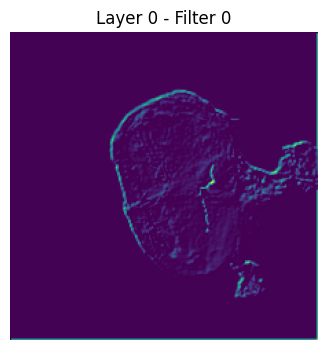

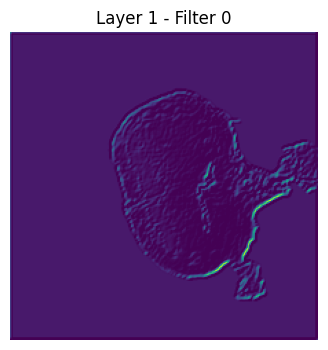

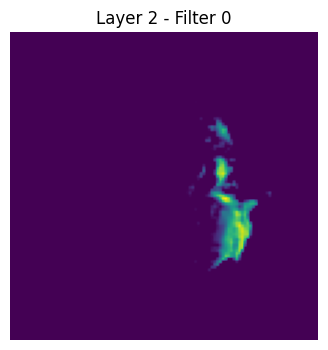

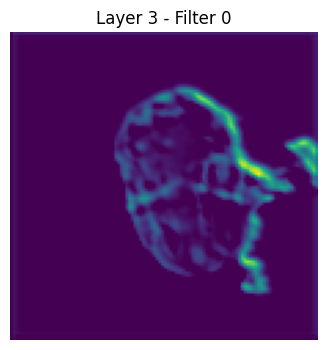

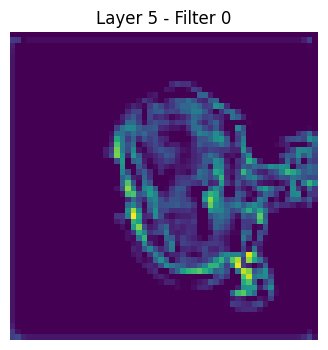

...

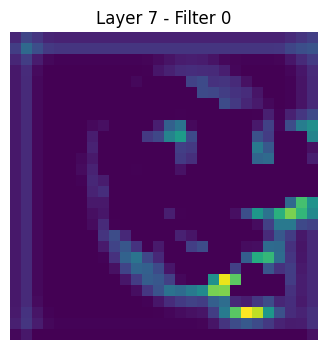

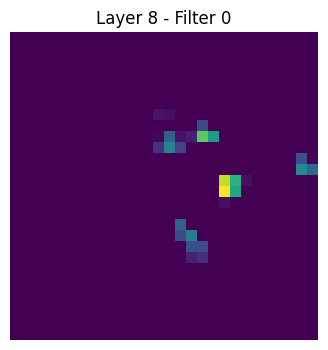

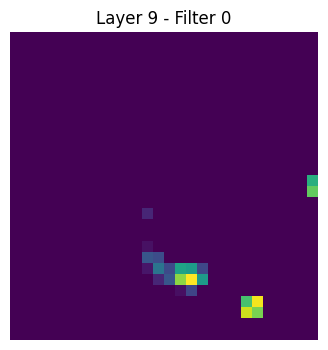

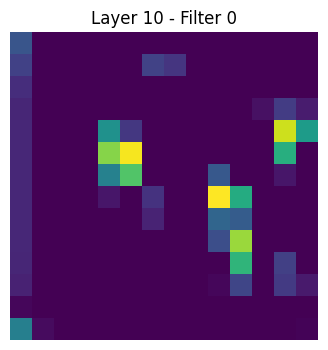

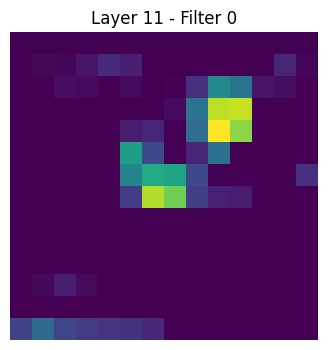

In [ ]:
layer_indices = [0, 1,2,3,5,6,7,8,9,10,11]  # Specify which layers you want to visualize
for layer_index in layer_indices:
    display_activation(activations, layer_index, col_size=4, row_size=4, act_index=0)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input


In [ ]:
model = VGG16(weights='imagenet', include_top=False)
model.summary()  # to see all layer names and types


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [ ]:
layer_outputs = [layer.output for layer in model.layers if 'conv' in layer.name]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

In [ ]:
img_path = '/content/drive/MyDrive/Datasets/kidney_refined_img/images new/Cold Kidney 30.jpg'
img = image.load_img(img_path, target_size=(224, 224))  # VGG16 expects 224x224 images
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)


In [ ]:
activations = activation_model.predict(img_array)

1/1 [==============================] - 1s 1s/step


In [ ]:
from keras.applications.vgg16 import VGG16

# Load the VGG16 model
model = VGG16(weights='imagenet', include_top=False)

# Display each layer and its index if it's a convolutional layer
for i, layer in enumerate(model.layers):
    if 'conv' in layer.name:
        print(f"Index: {i}, Layer Name: {layer.name}")

Index: 1, Layer Name: block1_conv1
Index: 2, Layer Name: block1_conv2
Index: 4, Layer Name: block2_conv1
Index: 5, Layer Name: block2_conv2
Index: 7, Layer Name: block3_conv1
Index: 8, Layer Name: block3_conv2
Index: 9, Layer Name: block3_conv3
Index: 11, Layer Name: block4_conv1
Index: 12, Layer Name: block4_conv2
Index: 13, Layer Name: block4_conv3
Index: 15, Layer Name: block5_conv1
Index: 16, Layer Name: block5_conv2
Index: 17, Layer Name: block5_conv3


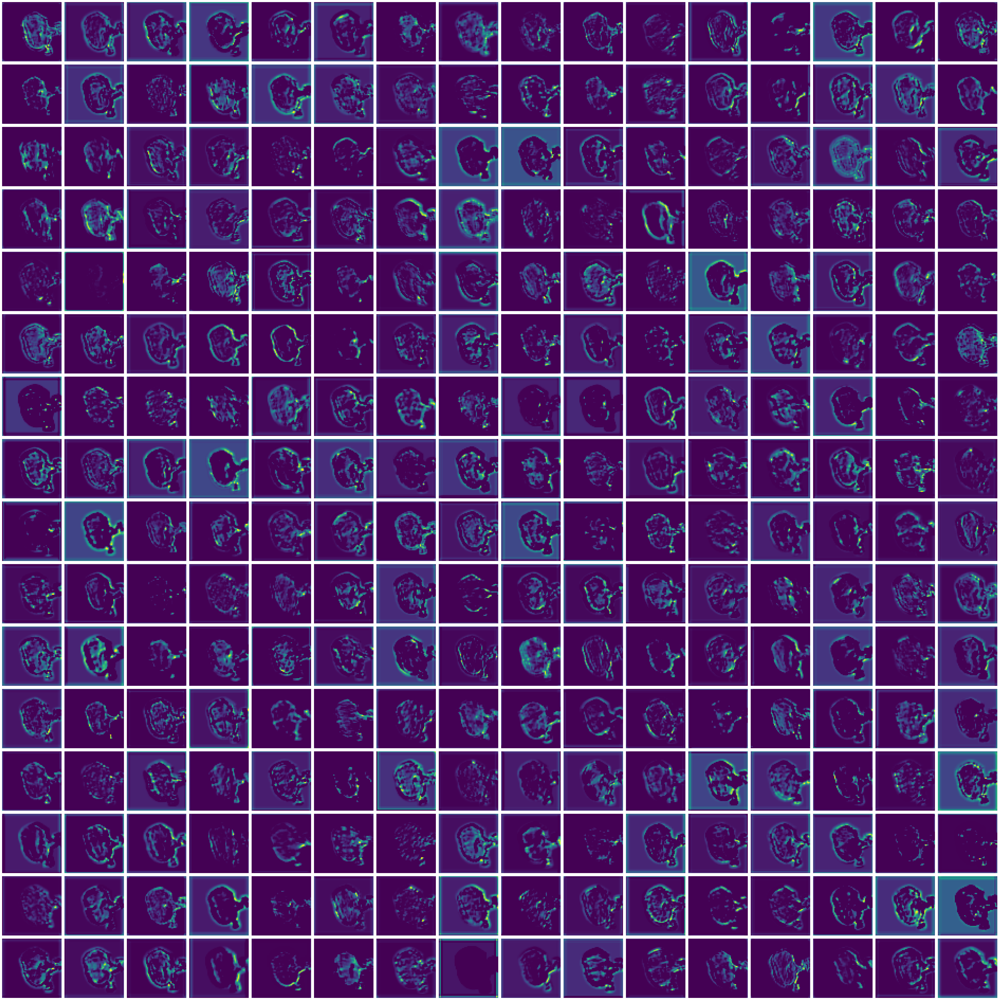

In [ ]:
import math

def plot_layer_activations(activations, layer_idx):
    layer_activation = activations[layer_idx]
    num_filters = layer_activation.shape[-1]

    # Calculate the grid size: aim for a nearly square layout
    n_cols = int(math.sqrt(num_filters))
    n_rows = (num_filters + n_cols - 1) // n_cols  # Ensure enough rows to accommodate all filters

    plt.figure(figsize=(n_cols * 3, n_rows * 3))  # Dynamic figure size based on the number of columns and rows

    for i in range(num_filters):
        ax = plt.subplot(n_rows, n_cols, i + 1)
        ax.imshow(layer_activation[0, :, :, i], cmap='viridis')
        ax.axis('off')

    plt.tight_layout()  # This will adjust subplot params so that subplots fit into the figure area.
    plt.show()

plot_layer_activations(activations, 5)  # Replace 0 with other indices to visualize other layers

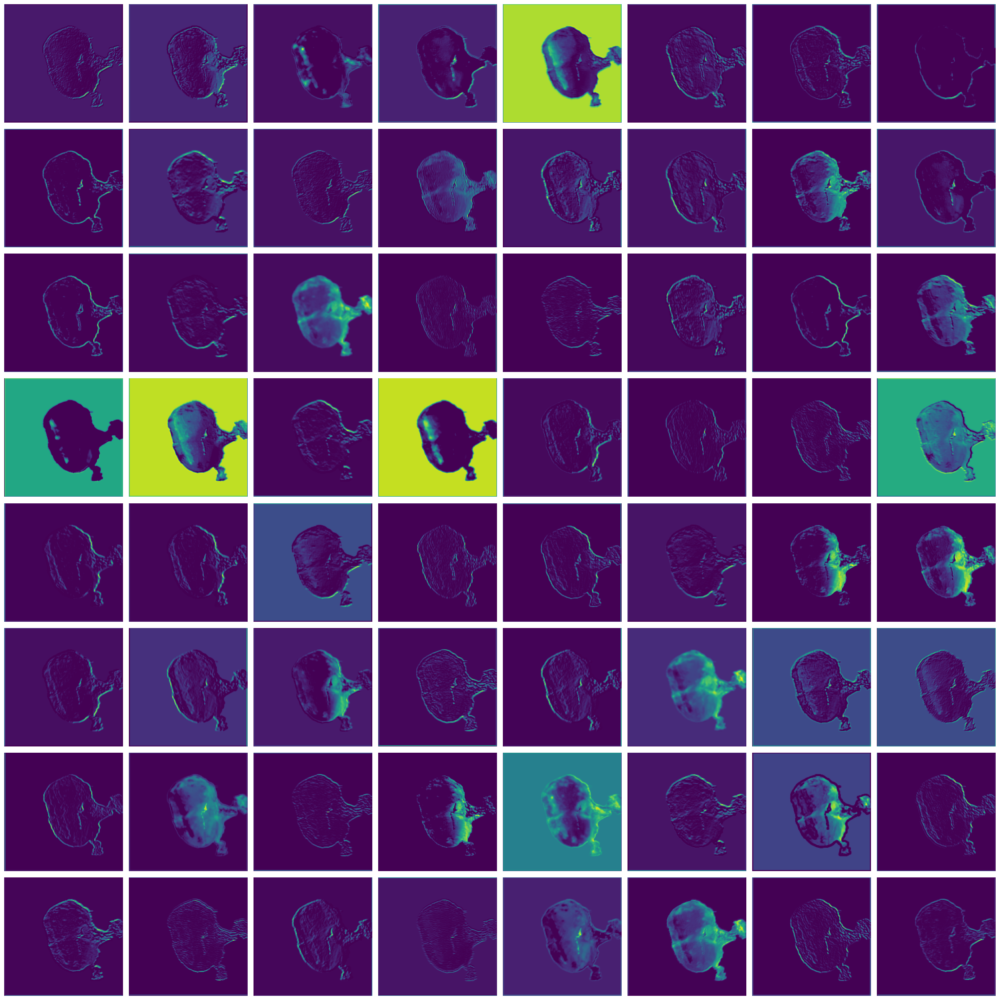

In [ ]:
plot_layer_activations(activations, 1)

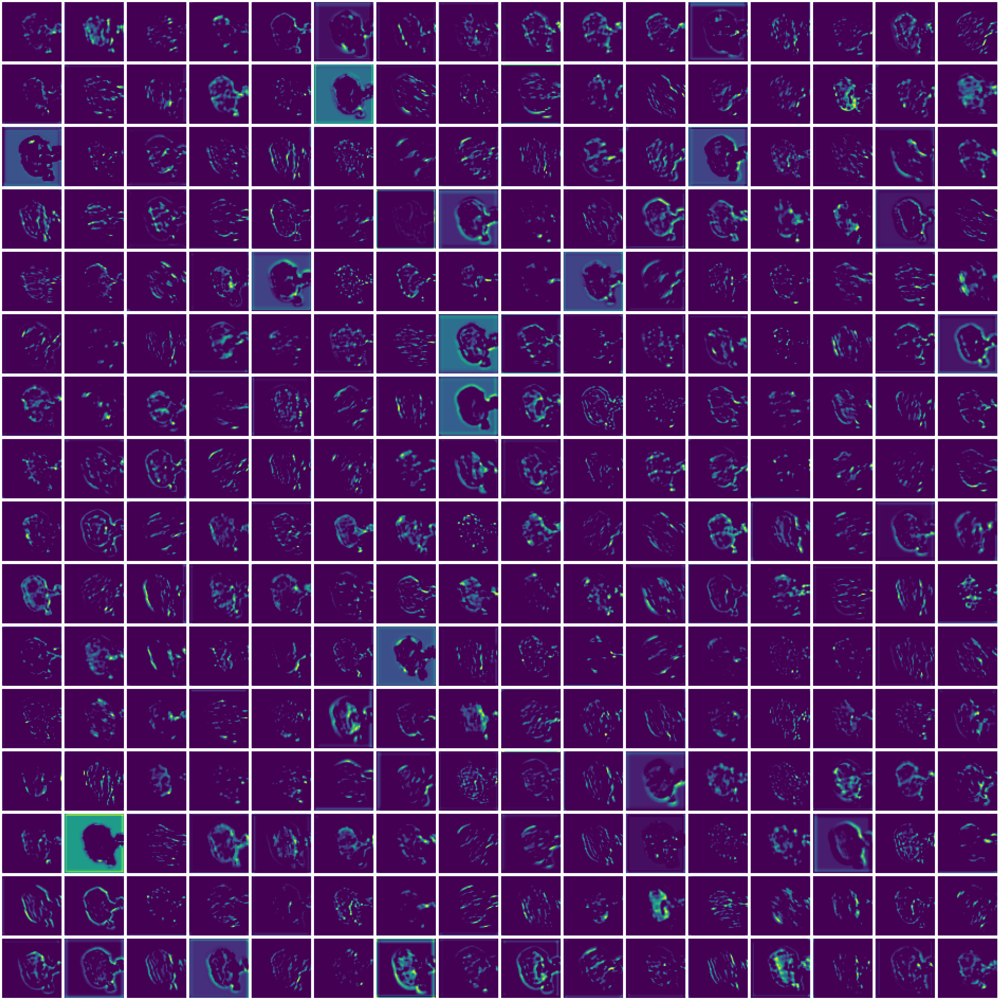

In [ ]:
plot_layer_activations(activations, 6)

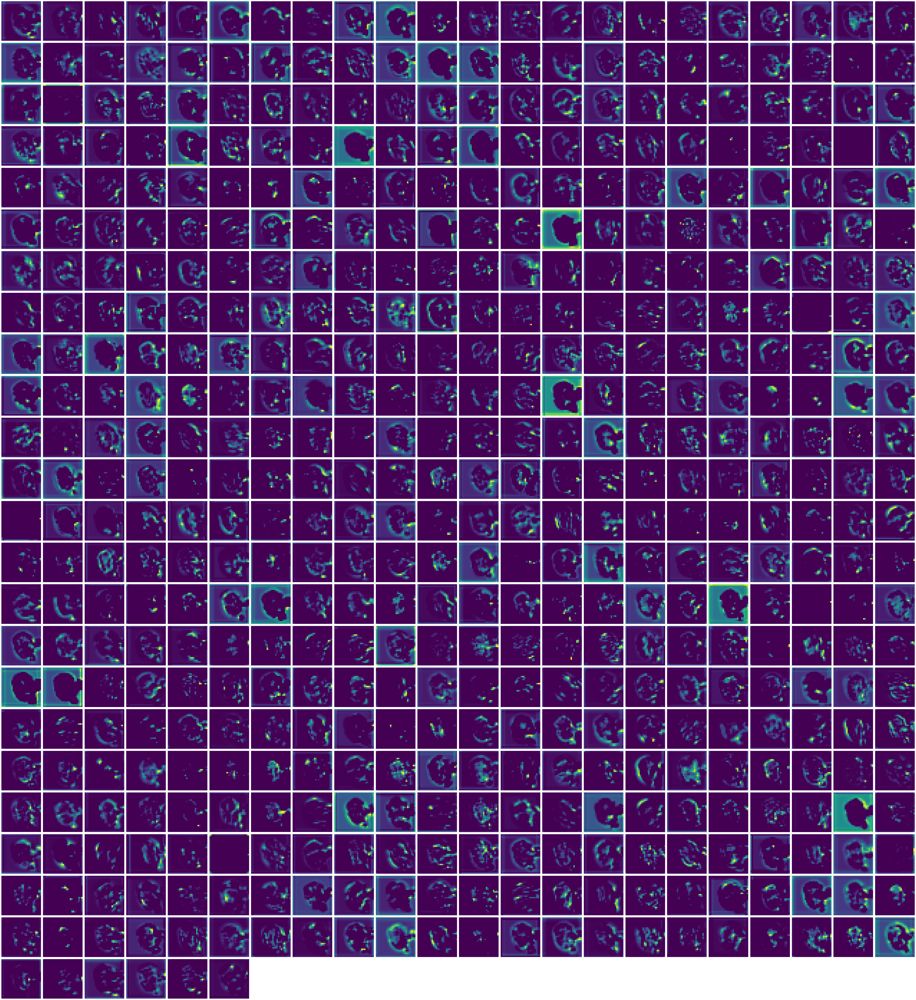

In [ ]:
plot_layer_activations(activations, 7)